### 인공지능으로 세상에 없던 새로운 자동차 만들기

**데이터 준비** <br/>

**Base GAN** <br/>
* Modeling
    * generator
    * discriminator
* 성능 지표
* 시각화
    * 가짜 이미지
    * 성능 지표
* Train
    * Train Step
    * 파라미터 설정
    * 훈련
    
**Advanced GAN** <br/>
* Modeling
    * generator
    * discriminator
    * 이미지 구축
    * gan
* Plotting
    * 가짜 이미지
* Train
    * Train Step
    * Train

****

**개요**

* 이 프로젝트는 이미지 데이터로부터 새로운 이미지를 생성하는 GAN 프로젝트입니다.
* 핵심 모델이 두개인데, 이미지를 생성하는 generator와 이미지의 진위 여부를 판별하는 discriminator입니다.
* 아래 이미지와 같이 **generator가 생성한 이미지를 discriminator가 판별하는 과정**을 backpropagation 하여, 이미지 생성이 점차 본래 이미지에 가까워집니다.
* cifar10의 자동차(automobile) 클래스 이미지를 사용하여 새로운 자동차 이미지를 생성하겠습니다.

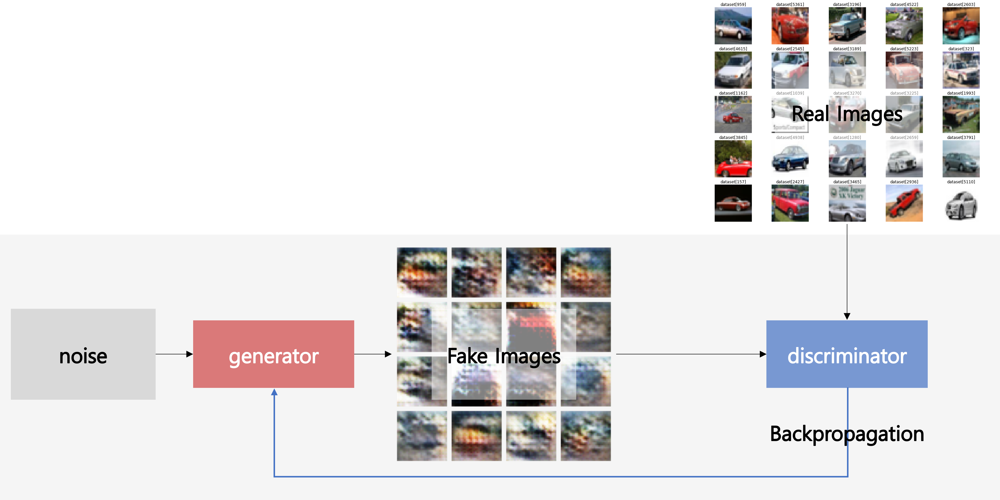

In [57]:
# 모델 개요
display.Image("gan.png", width = 800)

****

In [1]:
import os
import time
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython import display

import imageio
import glob

* 라벨을 입력하면, 해당 라벨을 가지고 있는 데이터를 추출 및 변환하여 주는 함수(my_load_data)입니다.
* 특별히 시험 데이터를 사용하지 않기 때문에 훈련 데이터와 시험 데이터를 결합하여 사용하고자 합니다.

In [2]:
## 데이터 로드
def my_load_data(label = None):
    cifar10 = tf.keras.datasets.cifar10
    (train_x, train_y), (test_x, test_y) = cifar10.load_data()
    
    # 특정 라벨 데이터 추출
    if label:
        # 훈련 데이터 이미지
        df = pd.DataFrame(list(zip(train_x, train_y)), columns = ['img', 'class'])
        df = df[df['class'] == label]
        train_x = np.array([i for i in list(df['img'])])
        
        # 시험 데이터 이미지
        df = pd.DataFrame(list(zip(train_x, train_y)), columns = ['img', 'class'])
        df = df[df['class'] == label]
        test_x = np.array([i for i in list(df['img'])])
        
        x = np.concatenate((train_x, test_x)) # 훈련 데이터, 시험 데이터 결합
        x = (x - 127.5) / 127.5 # (-1, 1) 값으로 정규화
    
    return x

* 자동차 이미지만 추출합니다.

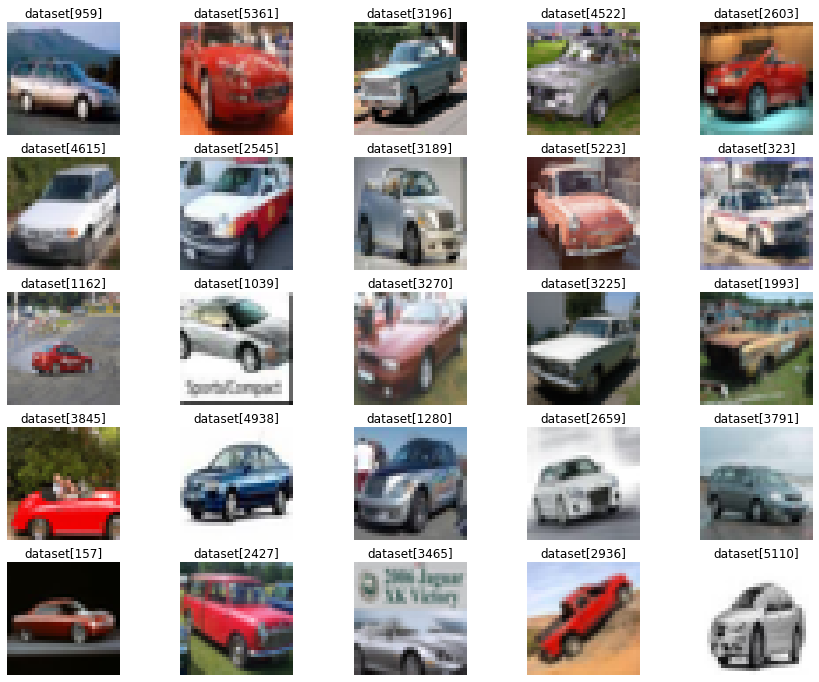

In [3]:
dataset = my_load_data(1) # label = 1 (automobile)

# 미리보기
plt.figure(figsize = (15, 12))

for i in range(25):
    idx = np.random.randint(dataset.shape[0])
    plt.subplot(5, 5, i + 1)
    plt.imshow(np.array(dataset[i] * 127.5 + 127.5).astype('uint8'))
    plt.title(f'dataset[{idx}]')
    plt.axis('off')
plt.show()

***

**Base GAN**

In [4]:
## generator
def build_generator():
    
    # 0.
    model = tf.keras.Sequential()
    
    # 1. dense
    model.add(tf.keras.layers.Dense(8 * 8 * 256, use_bias = False, input_shape = (100, ))) # noise dim = 100
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # 2. reshape
    model.add(tf.keras.layers.Reshape((8, 8, 256)))
    
    # 3. conv2d transpose
    model.add(tf.keras.layers.Conv2DTranspose(128, kernel_size = (5, 5), strides = (1, 1),
                                              padding = 'same', use_bias = False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # 4. conv2d transpose
    model.add(tf.keras.layers.Conv2DTranspose(64, kernel_size = (5, 5), strides = (2, 2),
                                             padding = 'same', use_bias = False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU())
    
    # 5. conv2d transpose
    model.add(tf.keras.layers.Conv2DTranspose(3, kernel_size = (5, 5), strides = (2, 2),
                                             padding = 'same', use_bias = False, activation = 'tanh'))
    
    return model

In [5]:
## discriminator
def build_discriminator():
    
    # 0.
    model = tf.keras.Sequential()
    
    # 1. conv2d
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides = (2, 2), padding = 'same', input_shape = (32, 32, 3)))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    
    # 2. conv2d
    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides = (2, 2), padding = 'same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))
    
    # 3. flatten
    model.add(tf.keras.layers.Flatten())
    
    # 4. dense
    model.add(tf.keras.layers.Dense(1))
    
    return model

In [6]:
generator = build_generator()
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16384)             1638400   
_________________________________________________________________
batch_normalization (BatchNo (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 16384)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0

In [7]:
discriminator = build_discriminator()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

In [8]:
## loss function & optimizer
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits = True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [9]:
## performance

# gen_loss
def generator_loss(fake_output):
    fake_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
    return fake_loss

# disc_loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

# real_acc & fake_acc
def acc(real_output, fake_output):
    real_acc = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_acc = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_acc, fake_acc

In [11]:
## fake img plot
def save_img(model, epoch, i, sample_seeds):
    predictions = model(sample_seeds, training = False)
    
    # 형식 변환
    np_predictions = predictions.numpy()
    np_predictions = (np_predictions * 127.5) + 127.5 # reverse of normalization
    np_predictions = np_predictions.astype(int)
    
    # 미리보기
    fig = plt.figure(figsize = (4, 4), constrained_layout = True)
    for j in range(predictions.shape[0]):
        plt.subplot(4, 4, j + 1)
        plt.imshow(np_predictions[j])
        plt.axis('off')
    
    # 플롯 이미지 파일 저장
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples1/sample_epoch_{:04d}_iter_{:03d}.png'
                .format(os.getenv('HOME'), epoch, i))
    
    plt.show()

In [12]:
## performance plot
def save_history(history, epoch, num):
    plt.figure(figsize = (8, 5), constrained_layout = True)
    
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.ylim(0.5, 1.5)
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_acc'])  
    plt.plot(history['real_acc'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')
    plt.ylim(-0.1, 1.1)
    plt.legend(['fake_acc', 'real_acc'], loc='upper left')  
    
    # 플롯 이미지 파일 저장
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history{}/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), num, epoch))
    plt.show()

* train 함수 안에서 train_step 함수를 호출합니다.

In [10]:
@tf.function
def train_step(imgs):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_imgs = generator(noise, training = True)
        
        real_output = discriminator(imgs, training = True)
        fake_output = discriminator(gen_imgs, training = True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
        real_acc, fake_acc = acc(real_output, fake_output)
        
    gen_grad = gen_tape.gradient(gen_loss, generator.trainable_variables)
    disc_grad = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gen_grad, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(disc_grad, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_acc, fake_acc

In [13]:
def train(dataset, epochs = 200, save_rate = 100):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_acc':[], 'fake_acc':[]} # performance
    
    for epoch in range(epochs):
        epoch_start = time.time()
        for i, img_batch in enumerate(dataset):
            gen_loss, disc_loss, real_acc, fake_acc = train_step(img_batch)
            
            # save performance
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_acc'].append(real_acc)
            history['fake_acc'].append(fake_acc)
            
            # fake img plot
            if i % 50 == 0:
                display.clear_output(wait = False)
                save_img(generator, epoch + 1, i + 1, seed)
                print(f'Epoch {epoch + 1} | Iter {i + 1}')
                print(f'Time for epoch {epoch + 1} : {int(time.time() - epoch_start)} sec')
            
            # save model (with weight)
            if (epoch + 1) % save_rate == 0:
                checkpoint.save(file_prefix = checkpoint_prefix)
            
        # fake img & performance plot
        display.clear_output(wait = False)
        save_img(generator, epochs, i, seed)
        print(f'Time for Training : {int(time.time() - start)} sec')
        save_history(history, epoch, 1)

* Checkpoint를 이용하여 중간에 의도치않게 훈련이 중단될 경우 중단된 훈련을 이어갈 수 있도록 합니다.

In [14]:
## checkpoint

checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer = generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

# checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir)) # load checkpoint

In [15]:
## dataset 

BUFFER_SIZE = dataset.shape[0]
BATCH_SIZE = 256

dataset = my_load_data(1)
dataset = tf.data.Dataset.from_tensor_slices(dataset).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [16]:
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim]) # [16, 100]

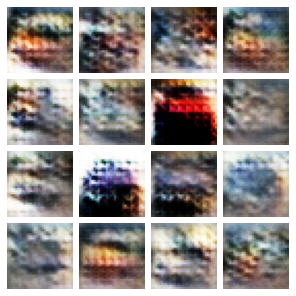

Time for Training : 763 sec


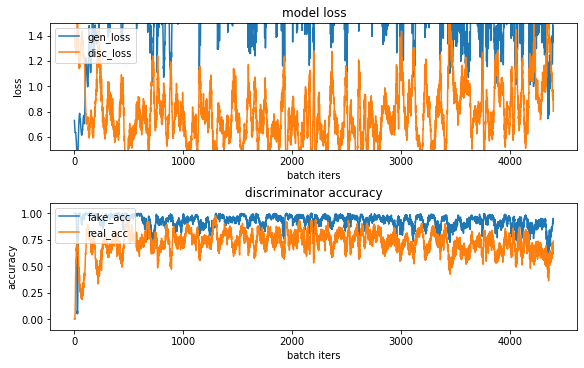

CPU times: user 14min 10s, sys: 2min 57s, total: 17min 7s
Wall time: 12min 44s


In [17]:
%%time
with tf.device('/GPU:0'):
    train(dataset)

* 자동차의 윤곽이 보이지만 종류를 육안으로 구별하기 어렵습니다.
* 산발적인 loss와, 일정한 accuracy는 성공적인 훈련으로 보기 어렵습니다.

***

**Advanced GAN**

In [18]:
## generator
def build_generator(noise_dim = 100):
    
    # 0.
    model = tf.keras.models.Sequential()
    
    # 1. dense
    model.add(tf.keras.layers.Dense(4 * 4 * 256, input_dim=noise_dim))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 2. reshape
    model.add(tf.keras.layers.Reshape((4, 4, 256)))
    
    # 3. conv2d transpose
    model.add(tf.keras.layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 4. conv2d transpose
    model.add(tf.keras.layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')) # upsample to 16x16
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 5. conv2d transpose
    model.add(tf.keras.layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')) # upsample to 32x32
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 6. conv2d transpose
    model.add(tf.keras.layers.Conv2D(3, (3,3), activation='tanh', padding='same'))
    
    return model

In [19]:
## discriminator
def build_discriminator():
    
    # 0.
    model = tf.keras.models.Sequential()
    
    # 1. conv2d
    model.add(tf.keras.layers.Conv2D(64, (3,3), padding='same', input_shape=(32, 32, 3)))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 2. conv2d
    model.add(tf.keras.layers.Conv2D(128, (3,3), strides=(2,2), padding='same')) # downsample
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 3. conv2d
    model.add(tf.keras.layers.Conv2D(128, (3,3), strides=(2,2), padding='same')) # downsample
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 4. conv2d
    model.add(tf.keras.layers.Conv2D(256, (3,3), strides=(2,2), padding='same')) # downsample
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    # 5. flatten
    model.add(tf.keras.layers.Flatten()) # classifier
    model.add(tf.keras.layers.Dropout(0.4))
    
    # 6. dense
    model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
    
    # compile model
    opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy']) 
    
    return model

In [20]:
generator = build_generator()
generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 4096)              413696    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 4096)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 8, 8, 128)         524416    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 16, 16, 128)       262272    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 16, 16, 128)      

In [21]:
discriminator = build_discriminator()
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 4, 4, 256)        

* Base GAN과 달리, gan을 추가로 생성합니다.

In [25]:
def build_gan(generator, discriminator):
    discriminator.trainable = False
    
    model = tf.keras.models.Sequential()
    model.add(generator)
    model.add(discriminator)
    
    # compile model
    opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    
    return model

* 실제 이미지를 가져오는 함수, 노이즈를 생성하는 함수, 가짜 이미지를 생성하는 함수를 정의합니다.

In [22]:
def real_img(dataset, n):
    i = np.random.randint(0, dataset.shape[0], n)
    x = dataset[i]
    y = np.ones((n, 1))
    return x, y

In [23]:
def make_noise(noise_dim, n):
    noise = np.random.randn(noise_dim * n)
    noise = noise.reshape(n, noise_dim)
    return noise

In [24]:
def fake_img(generator, noise_dim, n):
    noise = make_noise(noise_dim, n)

    x = generator.predict(noise)
    y = np.zeros((n, 1))

    return x, y

* 성능 지표를 저장하는 함수(save_history)는 앞서 정의한 그대로 사용하고, 가짜 이미지를 저장하는 함수(save_img)를 새로 정의합니다.

In [26]:
def save_img(gen, noise_dim, batch, epoch, n = 4):
    # fake img
    img, _ = fake_img(gen, noise_dim=noise_dim, n=batch//2)
    img = (img + 1) / 2.0
    
    # 미리보기
    fig = plt.figure(figsize = (n, n), constrained_layout = True)
    for i in range(n * n):
        plt.subplot(n, n, i+1)
        plt.imshow(img[i])
        plt.axis('off')
    
    # 플롯 이미지 저장
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples2/sample_epoch_{:04d}.png'
                .format(os.getenv('HOME'), epoch))
    plt.show()

* train 함수 안에서 train_step 함수를 호출합니다.

In [27]:
def train_step(gen, disc, gan, dataset, noise_dim, batch):
    # real_img - real_acc, real_loss
    x_real, y_real = real_img(dataset, batch//2)
    _, real_acc = disc.evaluate(x_real, y_real, verbose = 0)
    real_loss, _ = disc.train_on_batch(x_real, y_real)
    
    # fake_img - fake_acc, fake_loss
    x_fake, y_fake = fake_img(gen, noise_dim, batch//2)
    _, fake_acc = disc.evaluate(x_fake, y_fake, verbose = 0)
    fake_loss, _ = disc.train_on_batch(x_fake, y_fake)

    # discriminator loss
    disc_loss = real_loss + fake_loss

    # generator loss
    x_gan = make_noise(noise_dim, batch)
    y_gan = np.ones((batch, 1))
    gen_loss = gan.train_on_batch(x_gan, y_gan)

    return gen_loss, disc_loss, real_acc, fake_acc

In [28]:
def train(gen, disc, dataset, noise_dim = 100):
    gan = build_gan(gen, disc) # gan model

    epochs = 200
    batch = 128

    batch_per_epoch = dataset.shape[0] // batch

    # save performance
    history = {'gen_loss':[], 'disc_loss':[], 'real_acc':[], 'fake_acc':[]}

    for i in range(epochs):
        for j in range(batch_per_epoch):
            gen_loss, disc_loss, real_acc, fake_acc = train_step(gen, disc, gan, dataset, noise_dim, batch)

            # get performance
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_acc'].append(real_acc)
            history['fake_acc'].append(fake_acc)
            
        # fake_img & performance plot
        display.clear_output(wait = False)
        save_img(gen, noise_dim, batch, i)
        save_history(history, i, 2)
    
    return history

In [29]:
dataset = my_load_data(1)

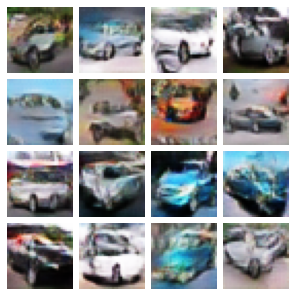

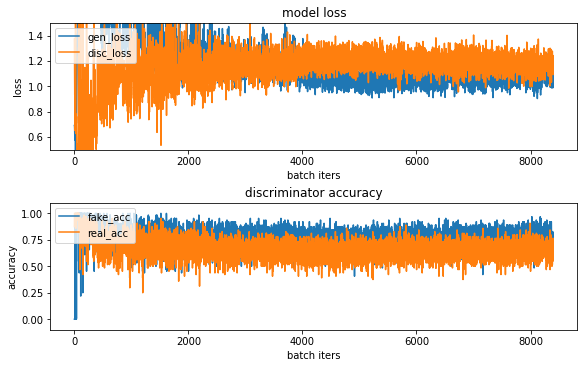

In [30]:
with tf.device('/GPU:0'):
    history = train(generator, discriminator, dataset)

* 실제 이미지 수준은 아니지만 자동차로 분별이 가능합니다.
* 이전에 비해 loss가 안정적으로 감소하고, accuracy도 감소 추세에 있습니다.

In [52]:
def detail_history(history, name):
    plt.figure(figsize = (10, 3))
    plt.plot(history[name])
    plt.ylabel(name)
    plt.xlabel('batch iters')
    plt.grid(True, axis = 'y')
    plt.show()

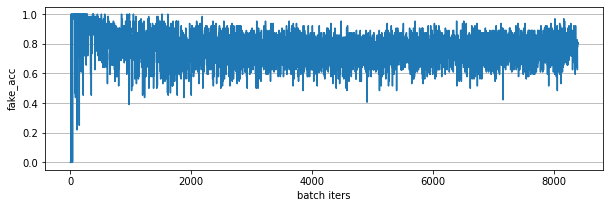

In [53]:
# fake accuracy detail
detail_history(history, 'fake_acc')

* 급진적이지는 않지만 추세적으로 하향하고 있습니다.

***

### Base GAN vs Advanced GAN

[Advanced GAN 참고자료](https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/)

**Model**

* Advanced GAN의 generator는 Base GAN generator에서 shape 축소, Batch Normalization을 제거, output을 conv2dTranspose에서 conv2d로 변경하여 형성하였습니다.

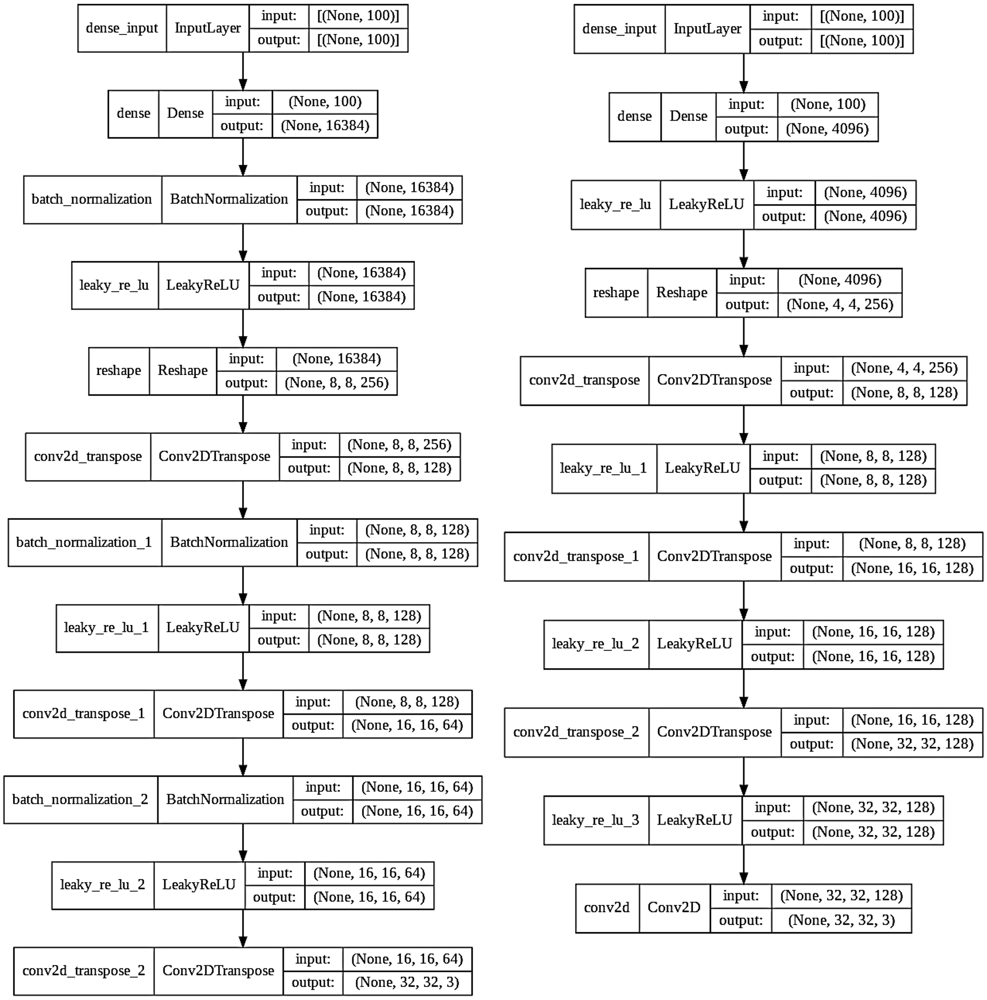

In [67]:
# Generator Base Gan vs Advanced GAN
display.Image("generator.png", width = 700)

* Advanced GAN의 discriminator는 Base GAN discriminator에서 conv2d layer 추가 및 파라미터 변경, droput 위치를 변경하여 형성하였습니다.

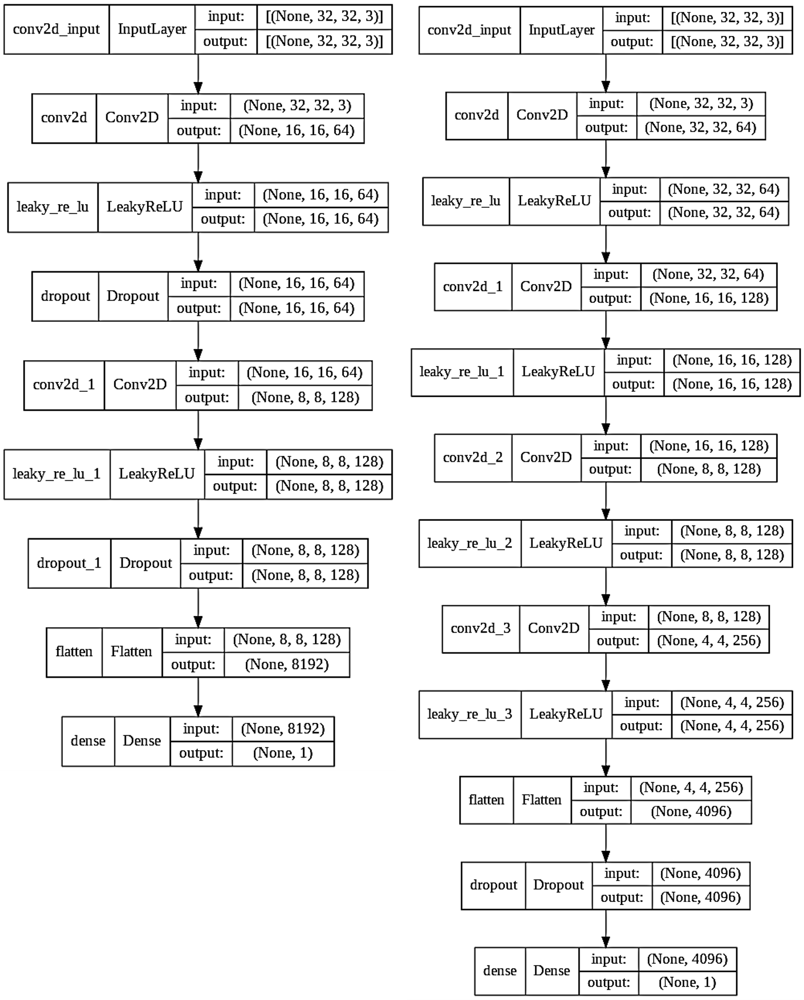

In [71]:
# Discriminator Base Gan vs Advanced GAN
display.Image("discriminator.png", width = 700)

**Logic**

* Base GAN의 경우 훈련 과정(train_step)에서 직접 fake_img 및 real_img를 모델의 output으로 받고,
* 이 훈련 과정(train_step)에서 tensorflow GradientTape을 이용하여 직접 가중치를 업데이트합니다.
* accuracy와 loss는 별도의 함수를 이용하여 계산합니다.

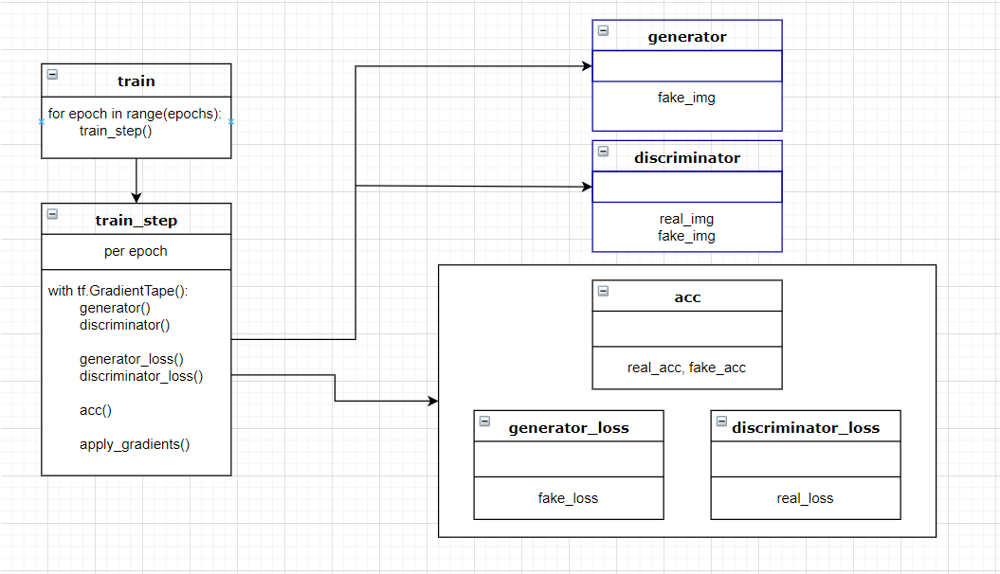

In [73]:
# Base GAN의 개요
display.Image("baseGAN.PNG", width = 700)

* 반면 Advanced GAN의 경우 별도의 함수를 이용하여 이미지를 받고,
* 훈련 과정(train_step)에서 tensorflow model.evaluate, model.train_on_batch를 이용하여 훈련합니다.
* 추가로 Advanced GAN은 generator와 discriminator를 합친 gan 모델을 생성하여 사용합니다.
* accuracy와 loss는 이 과정에서 얻은 점수를 사용합니다.

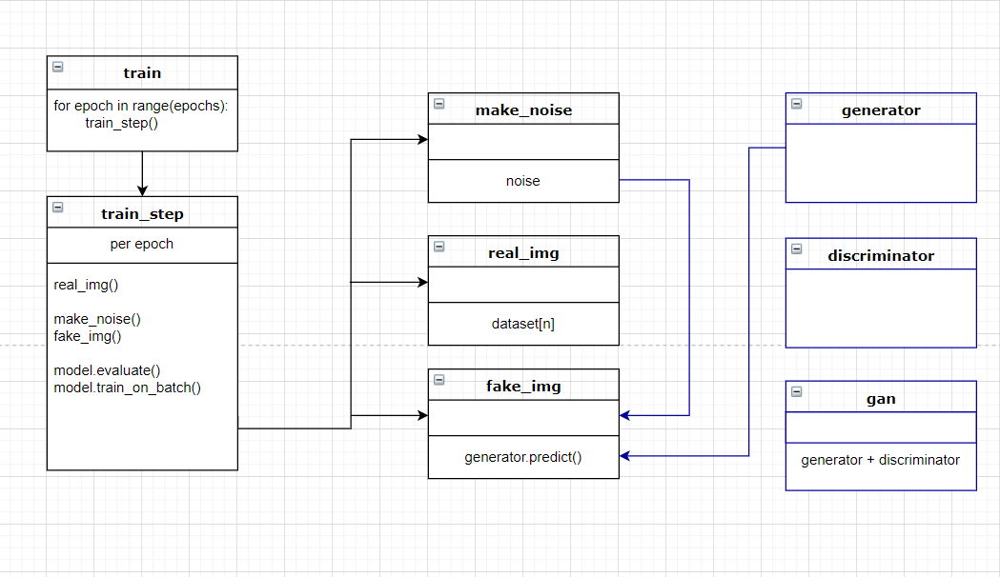

In [74]:
# Advanced GAN의 개요
display.Image("advancedGAN.PNG", width = 700)

**Result**

In [92]:
# Base GAN 생성 이미지
display.HTML('<img src="base.gif">')

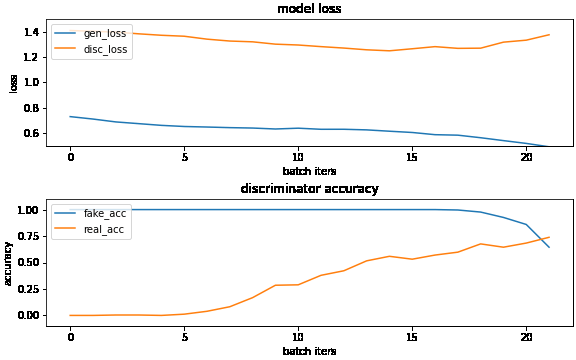

In [81]:
# Base GAN 모델 성능
display.Image("base2.gif")

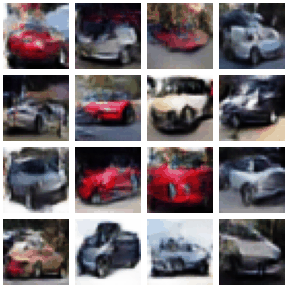

In [82]:
# Advanced GAN 생성 이미지
display.Image("advanced.gif")

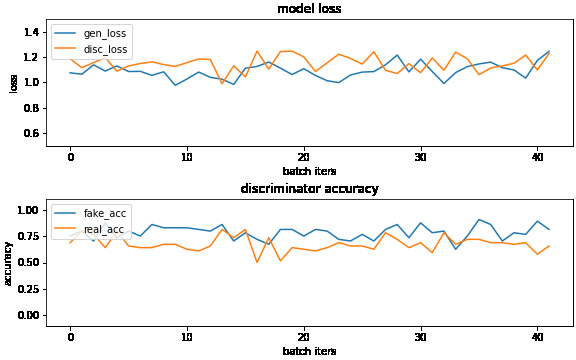

In [83]:
# Advanced GAN 모델 성능
display.Image("advanced2.gif")

****

**회고**

* 모델을 어떻게 형성하느냐에 따라 다르겠지만 훈련 시간이 제법 길어서 다양한 시도를 하기에 어려움을 겪었습니다.

* 또한 가짜 이미지에 대한 discriminator의 정확도(fake accuracy)가 잘 낮춰지지 않았습니다.
* 아래 이미지와 같이 어느정도 하향하는 추세를 보이기는 하지만, 다소 산발적이고 육안으로 보는 결과물의 품질과 뚜렷한 관련성이 느껴지지 않아서 과연 신뢰할 수 있는 지표일까 의문이 남습니다. 😥

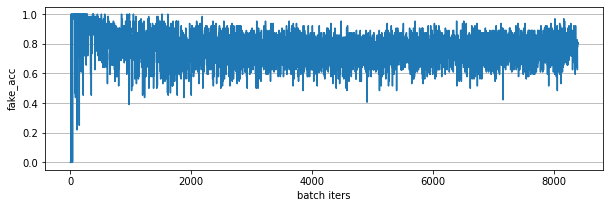

In [84]:
# fake accuracy
detail_history(history, 'fake_acc')